In [1]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt

In [2]:
import plotly.io as pio
pio.renderers.default = "notebook"

In [3]:
# Load bus data
df = pd.read_csv("Headway Data, 8-1-2023 to 9-30-2023.csv")

# Load ZIP geojson
zip_gdf = gpd.read_file("zipcodes.geojson")

In [4]:
print(df.columns)
print(zip_gdf.columns)

Index(['CALENDAR_ID', 'SERVICE_ABBR', 'ADHERENCE_ID', 'DATE', 'ROUTE_ABBR',
       'BLOCK_ABBR', 'OPERATOR', 'TRIP_ID', 'OVERLOAD_ID',
       'ROUTE_DIRECTION_NAME', 'TIME_POINT_ABBR', 'ROUTE_STOP_SEQUENCE',
       'TRIP_EDGE', 'LATITUDE', 'LONGITUDE', 'SCHEDULED_TIME',
       'ACTUAL_ARRIVAL_TIME', 'ACTUAL_DEPARTURE_TIME', 'ADHERENCE',
       'SCHEDULED_HDWY', 'ACTUAL_HDWY', 'HDWY_DEV', 'ADJUSTED_EARLY_COUNT',
       'ADJUSTED_LATE_COUNT', 'ADJUSTED_ONTIME_COUNT', 'STOP_CANCELLED',
       'PREV_SCHED_STOP_CANCELLED', 'IS_RELIEF', 'DWELL_IN_MINS',
       'SCHEDULED_LAYOVER_MINUTES'],
      dtype='object')
Index(['zip', 'objectid', 'po_name', 'shape_stlength', 'shape_starea',
       'geometry'],
      dtype='object')


In [5]:
import geopandas as gpd

gdf_stops = gpd.GeoDataFrame(
    df,
    geometry=gpd.points_from_xy(df['LONGITUDE'], df['LATITUDE']),
    crs="EPSG:4326"
)

In [6]:
zip_gdf = zip_gdf.to_crs("EPSG:4326")

In [7]:
gdf_with_zip = gpd.sjoin(
    gdf_stops,
    zip_gdf[['zip', 'geometry']],
    how='left',
    predicate='within'
)

In [8]:
gdf_with_zip['hdwy_diff'] = gdf_with_zip['ACTUAL_HDWY'] - gdf_with_zip['SCHEDULED_HDWY']

In [9]:
zip_perf = gdf_with_zip.groupby('zip').agg({
    'hdwy_diff': 'mean',
    'ADHERENCE': 'mean'
}).reset_index()

In [10]:
merged = zip_gdf.merge(zip_perf, on='zip', how='left')

In [11]:
df.columns = df.columns.str.lower()

In [12]:
gdf_stops['hdwy_diff'] = gdf_stops['ACTUAL_HDWY'] - gdf_stops['SCHEDULED_HDWY']

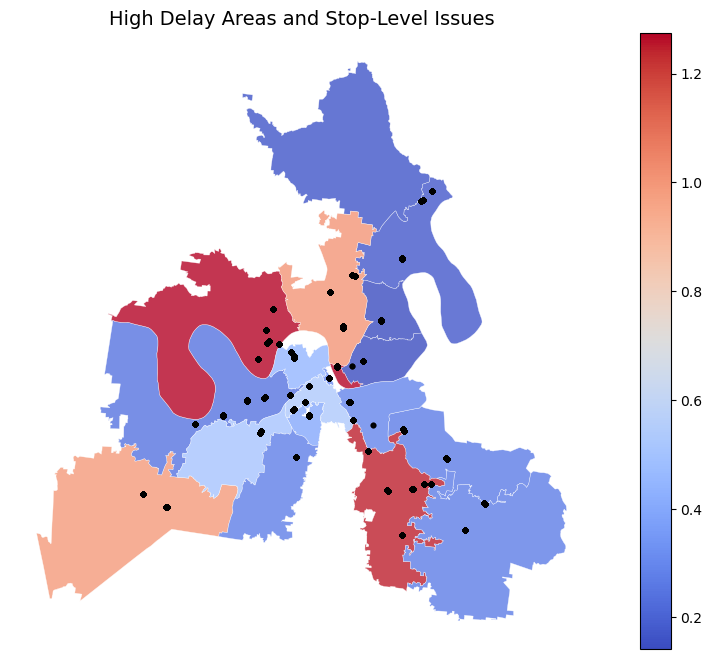

In [13]:
fig, ax = plt.subplots(figsize=(12, 8))

vmin = merged['hdwy_diff'].quantile(0.05)
vmax = merged['hdwy_diff'].quantile(0.95)

merged.plot(
    ax=ax,
    column='hdwy_diff',
    cmap='coolwarm',
    vmin=vmin,
    vmax=vmax,
    legend=True,
    linewidth=0.3,
    edgecolor='white',
    alpha=0.8
)

# Use enriched dataset
high_delay_stops = gdf_with_zip[gdf_with_zip['hdwy_diff'] > vmax]

high_delay_stops.plot(
    ax=ax,
    color='black',
    markersize=10,
    alpha=0.7
)

ax.set_title("High Delay Areas and Stop-Level Issues", fontsize=14)
ax.axis('off')

plt.show()

In [14]:
df_sorted = df.sort_values(["route_abbr", "route_stop_sequence"])

In [15]:
import plotly.express as px

fig = px.line_map(
    df_sorted,
    lat="latitude",
    lon="longitude",
    color="route_abbr",
    line_group="route_abbr"
)

fig.update_layout(map_style="open-street-map")
fig.show()

In [16]:
route_perf = df.groupby("route_abbr").agg(
    avg_hdwy_dev=("hdwy_dev", "mean"),
    late_count=("adjusted_late_count", "sum"),
    early_count=("adjusted_early_count", "sum"),
    ontime_count=("adjusted_ontime_count", "sum")
).reset_index()

In [17]:
route_geo = df.groupby("route_abbr").agg(
    latitude=("latitude", "mean"),
    longitude=("longitude", "mean")
).reset_index()

In [18]:
route_map = route_perf.merge(route_geo, on="route_abbr")

In [19]:
route_map["severity"] = pd.qcut(
    route_map["avg_hdwy_dev"],
    q=3,
    labels=["Low deviation", "Medium deviation", "High deviation"]
)

In [20]:
route_map["severity"] = pd.cut(
    route_map["avg_hdwy_dev"],
    bins=[0, 0.3, 0.7, 1.2],
    labels=["Stable", "Moderate instability", "High instability"]
)

In [21]:
import plotly.express as px

fig = px.scatter_mapbox(
    route_map,
    lat="latitude",
    lon="longitude",
    color="avg_hdwy_dev",
    color_continuous_scale="RdYlGn_r",
    size="avg_hdwy_dev",
    hover_name="route_abbr",
    hover_data=["late_count", "ontime_count"],
    zoom=10,
    height=650
)

fig.update_layout(mapbox_style="open-street-map")
fig.show()

C:\Users\Student\AppData\Local\Temp\ipykernel_5732\2745985581.py:3: DeprecationWarning: *scatter_mapbox* is deprecated! Use *scatter_map* instead. Learn more at: https://plotly.com/python/mapbox-to-maplibre/
  fig = px.scatter_mapbox(


In [22]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt

# Load data
df = pd.read_csv("Headway Data, 8-1-2023 to 9-30-2023.csv")
gdf = gpd.read_file("zipcodes.geojson")

# Clean column names
df.columns = df.columns.str.lower()

# Create deviation
df['hdwy_dev'] = df['actual_hdwy'] - df['scheduled_hdwy']

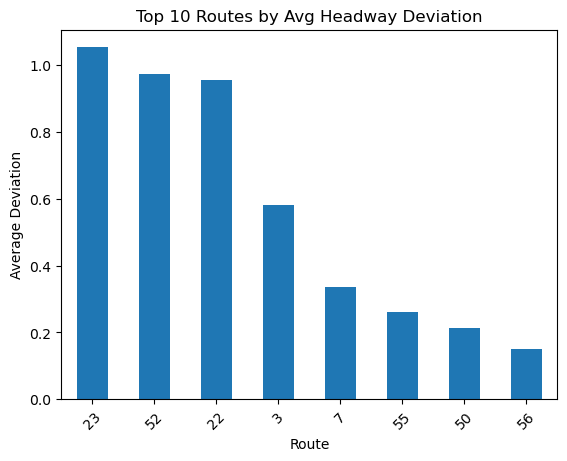

In [23]:
route_avg = (
    df.groupby('route_abbr')['hdwy_dev']
    .mean()
    .sort_values(ascending=False)
    .head(10)
)

plt.figure()
route_avg.plot(kind='bar')
plt.title("Top 10 Routes by Avg Headway Deviation")
plt.xlabel("Route")
plt.ylabel("Average Deviation")
plt.xticks(rotation=45)
plt.show()

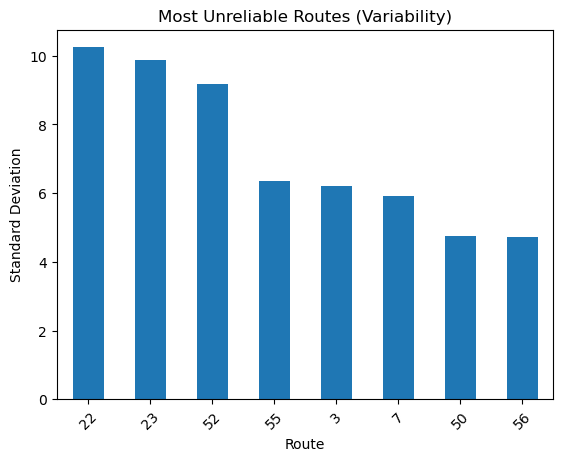

In [24]:
route_std = (
    df.groupby('route_abbr')['hdwy_dev']
    .std()
    .sort_values(ascending=False)
    .head(10)
)

plt.figure()
route_std.plot(kind='bar')
plt.title("Most Unreliable Routes (Variability)")
plt.xlabel("Route")
plt.ylabel("Standard Deviation")
plt.xticks(rotation=45)
plt.show()

In [25]:
import pandas as pd
import plotly.express as px

df = pd.read_csv("Headway Data, 8-1-2023 to 9-30-2023.csv")
df.columns = df.columns.str.lower()

# Create deviation
df['hdwy_dev'] = df['actual_hdwy'] - df['scheduled_hdwy']

# Clean data
df = df.dropna(subset=["latitude", "longitude", "hdwy_dev"])
df = df[df["hdwy_dev"].abs() < 100]

# Sample for speed
sample = df.sample(min(5000, len(df)), random_state=42)

# Needed for sizing points
sample["abs_dev"] = sample["hdwy_dev"].abs()

In [26]:
stop_avg = (
    df.groupby(["time_point_abbr", "latitude", "longitude"])["hdwy_dev"]
    .mean()
    .reset_index()
)

stop_avg["abs_dev"] = stop_avg["hdwy_dev"].abs()

fig = px.scatter_map(
    stop_avg,
    lat="latitude",
    lon="longitude",
    color="hdwy_dev",
    size="abs_dev",
    hover_name="time_point_abbr",
    zoom=10,
    height=600
)

fig.show()

In [27]:
fig = px.scatter(
    sample,
    x="scheduled_hdwy",
    y="actual_hdwy",
    color="hdwy_dev",
    size="abs_dev",
    hover_data=["route_abbr"]
)

fig.show()

In [28]:
stop_avg = (
    df.groupby(["time_point_abbr", "latitude", "longitude"])["hdwy_dev"]
    .mean()
    .reset_index()
)

# Top 15 worst stops
top_stops = stop_avg.sort_values("hdwy_dev", ascending=False).head(15)

import plotly.express as px

fig = px.bar(
    top_stops,
    x="time_point_abbr",
    y="hdwy_dev",
    title="Top 15 Worst Stops by Average Delay"
)

fig.show()

In [29]:
df["time"] = pd.to_datetime(df["actual_arrival_time"], errors="coerce")
df = df.dropna(subset=["time"])

df["hour"] = df["time"].dt.hour

hour_avg = df.groupby("hour")["hdwy_dev"].mean().reset_index()

fig = px.line(
    hour_avg,
    x="hour",
    y="hdwy_dev",
    title="Average Delay by Hour of Day"
)

fig.show()

In [30]:
stop_var = (
    df.groupby("time_point_abbr")["hdwy_dev"]
    .std()
    .reset_index()
    .sort_values("hdwy_dev", ascending=False)
    .head(15)
)

fig = px.bar(
    stop_var,
    x="time_point_abbr",
    y="hdwy_dev",
    title="Most Unpredictable Stops"
)

fig.show()

In [31]:
import geopandas as gpd
import pandas as pd

df = pd.read_csv("Headway Data, 8-1-2023 to 9-30-2023.csv")
df.columns = df.columns.str.lower()

# Create deviation
df["hdwy_dev"] = df["actual_hdwy"] - df["scheduled_hdwy"]

# Drop missing coords
df = df.dropna(subset=["latitude", "longitude"])

# Convert to GeoDataFrame (points)
gdf_points = gpd.GeoDataFrame(
    df,
    geometry=gpd.points_from_xy(df.longitude, df.latitude),
    crs="EPSG:4326"
)

# Load zipcode polygons
zip_gdf = gpd.read_file("zipcodes.geojson").to_crs("EPSG:4326")

# Spatial join
joined = gpd.sjoin(gdf_points, zip_gdf, how="left", predicate="within")

# ✅ THIS IS YOUR FIX
df["zipcode"] = joined["zip"]

# Clean
df = df.dropna(subset=["zipcode"])
df["zipcode"] = df["zipcode"].astype(str)

In [32]:
# Force dataframe zipcodes to string + 5 digits
df["zipcode"] = df["zipcode"].astype(str).str.zfill(5)

zip_avg = df.groupby("zipcode")["hdwy_dev"].mean().reset_index()

In [33]:
import json

with open("zipcodes.geojson") as f:
    geojson = json.load(f)

for feature in geojson["features"]:
    feature["properties"]["zip"] = str(feature["properties"]["zip"]).zfill(5)

In [34]:
for feature in geojson["features"]:
    feature["properties"]["zip"] = str(feature["properties"]["zip"]).zfill(5)

In [35]:
geo_zips = set([f["properties"]["zip"] for f in geojson["features"]])
data_zips = set(zip_avg["zipcode"])

print("Matches:", geo_zips.intersection(data_zips))

Matches: {'37211', '37212', '37240', '37207', '37213', '37209', '37216', '37115', '37215', '37210', '37203', '37208', '37221', '37013', '37217', '37219', '37205', '37218', '37072', '37206'}


In [36]:
fig = px.choropleth_map(
    zip_avg,
    geojson=geojson,
    locations="zipcode",
    featureidkey="properties.zip",
    color="hdwy_dev",
    color_continuous_scale="RdBu",
    range_color=[0, 1],  # <-- better for your data
    center={"lat": 36.16, "lon": -86.78},
    zoom=10,
    opacity=0.6
)

fig.show()

In [37]:
# Flag bad delays (adjust threshold if needed)
df["severe_delay"] = df["hdwy_dev"] > 10

zip_severe = (
    df.groupby("zipcode")["severe_delay"]
    .mean()
    .reset_index()
)

import plotly.express as px

fig = px.bar(
    zip_severe.sort_values("severe_delay"),
    x="zipcode",
    y="severe_delay",
    title="Percent of Severe Delays by Zip Code"
)

fig.show()

In [38]:
top_bad = zip_severe.sort_values("severe_delay", ascending=False).head(10)

fig = px.choropleth_map(
    top_bad,
    geojson=geojson,
    locations="zipcode",
    featureidkey="properties.zip",
    color="severe_delay",
    title="Worst Zip Codes (Severe Delays Only)",
    center={"lat": df["latitude"].mean(), "lon": df["longitude"].mean()},
    zoom=10
)

fig.show()

In [39]:
zip_route = (
    df.groupby(["zipcode", "route_abbr"])["hdwy_dev"]
    .mean()
    .reset_index()
)

worst_combo = zip_route.sort_values("hdwy_dev", ascending=False).head(15)

fig = px.bar(
    worst_combo,
    x="zipcode",
    y="hdwy_dev",
    color="route_abbr",
    title="Worst Route-Zipcode Combinations"
)

fig.show()

In [40]:
# Make sure time is set
df["time"] = pd.to_datetime(df["actual_arrival_time"], errors="coerce")
df = df.dropna(subset=["time"])

df["hour"] = df["time"].dt.hour

# Find top 10 worst zipcodes by avg delay
top10_zips = (
    df.groupby("zipcode")["hdwy_dev"]
    .mean()
    .sort_values(ascending=False)
    .head(3)
    .index
)

# Filter data
filtered = df[df["zipcode"].isin(top10_zips)]

# Aggregate by hour + zipcode
zip_time = (
    filtered.groupby(["zipcode", "hour"])["hdwy_dev"]
    .mean()
    .reset_index()
)

import plotly.express as px

fig = px.line(
    zip_time,
    x="hour",
    y="hdwy_dev",
    color="zipcode",
    title="Top 3 Worst Zipcodes: Delay by Hour"
)

fig.show()

In [43]:
df['total_obs'] = (
    df['adjusted_ontime_count'] +
    df['adjusted_late_count'] +
    df['adjusted_early_count']
)

df['on_time_rate'] = df['adjusted_ontime_count'] / df['total_obs']

In [44]:
route_avg = df.groupby('route_abbr')['on_time_rate'].mean()

In [45]:
df = df.merge(route_avg, on='route_abbr', suffixes=('', '_route_avg'))

df['driver_vs_route'] = df['on_time_rate'] - df['on_time_rate_route_avg']

In [46]:
driver_perf = (
    df.groupby('operator')['driver_vs_route']
    .mean()
    .sort_values()
)

top10 = driver_perf.tail(10)
bottom10 = driver_perf.head(10)

In [48]:
route_var = df.groupby('route_abbr')['on_time_rate'].var().mean()
driver_var = df.groupby('operator')['on_time_rate'].var().mean()

print("Route variance:", route_var)
print("Driver variance:", driver_var)

Route variance: 0.15216418103906917
Driver variance: 0.15661016455036558


In [49]:
time_driver = (
    df.groupby(['operator', 'hour'])['on_time_rate']
    .mean()
    .reset_index()
)

In [50]:
driver_summary = (
    df.groupby(['operator', 'route_abbr'])
    .agg({
        'on_time_rate': 'mean'
    })
    .reset_index()
)

# Route baseline
route_avg = df.groupby('route_abbr')['on_time_rate'].mean().reset_index()
route_avg = route_avg.rename(columns={'on_time_rate': 'route_avg'})

# Merge
driver_summary = driver_summary.merge(route_avg, on='route_abbr')

# Now collapse to driver level
driver_perf = (
    driver_summary.groupby('operator')
    .agg({
        'on_time_rate': 'mean',
        'route_avg': 'mean'
    })
    .reset_index()
)

In [78]:
driver_perf['impact_size'] = driver_perf['impact_pct'].abs()

In [81]:
import pandas as pd
import plotly.express as px

# -------------------------
# 1. On-time metric
# -------------------------
df['total_obs'] = (
    df['adjusted_ontime_count'] +
    df['adjusted_late_count'] +
    df['adjusted_early_count']
)

df = df[df['total_obs'] > 0]
df['on_time_rate'] = df['adjusted_ontime_count'] / df['total_obs']


# -------------------------
# 2. Driver + route aggregation
# -------------------------
driver_route = (
    df.groupby(['operator', 'route_abbr'], as_index=False)
    .agg(on_time_rate=('on_time_rate', 'mean'))
)

route_avg = (
    df.groupby('route_abbr', as_index=False)
    .agg(route_avg=('on_time_rate', 'mean'))
)

driver_route = driver_route.merge(route_avg, on='route_abbr')


# -------------------------
# 3. Driver performance
# -------------------------
driver_perf = (
    driver_route.groupby('operator', as_index=False)
    .agg(
        on_time_rate=('on_time_rate', 'mean'),
        route_avg=('route_avg', 'mean')
    )
)

# Impact = driver vs expectation
driver_perf['impact_pct'] = (driver_perf['on_time_rate'] - driver_perf['route_avg']) * 100
driver_perf['on_time_pct'] = driver_perf['on_time_rate'] * 100
driver_perf['route_avg_pct'] = driver_perf['route_avg'] * 100


# -------------------------
# 4. Filter small sample drivers
# -------------------------
trip_counts = df['operator'].value_counts().reset_index()
trip_counts.columns = ['operator', 'trip_count']

driver_perf = driver_perf.merge(trip_counts, on='operator')
driver_perf = driver_perf[driver_perf['trip_count'] > 100]


# -------------------------
# 5. Ranking (IMPORTANT)
# -------------------------
driver_ranked = driver_perf.sort_values('impact_pct', ascending=True)

bottom5 = driver_ranked.head(5)
top5 = driver_ranked.tail(5)


# -------------------------
# 6. Scatter plot (main analysis)
# -------------------------
fig = px.scatter(
    driver_perf,
    x='route_avg_pct',
    y='on_time_pct',
    color='impact_pct',
    color_continuous_scale='RdBu',
    range_color=[-5, 5],
    hover_data=['operator', 'trip_count'],
    title='Driver Impact on On-Time Performance vs Route Expectation'
)


# -------------------------
# 7. Reference line (y = x)
# -------------------------
min_val = min(driver_perf['route_avg_pct'].min(), driver_perf['on_time_pct'].min())
max_val = max(driver_perf['route_avg_pct'].max(), driver_perf['on_time_pct'].max())

fig.add_shape(
    type='line',
    x0=min_val, y0=min_val,
    x1=max_val, y1=max_val,
    line=dict(dash='dash', color='gray')
)


# -------------------------
# Bottom 5 (labeled)
# -------------------------
fig.add_scatter(
    x=bottom5['route_avg_pct'],
    y=bottom5['on_time_pct'],
    mode='markers+text',
    text=bottom5['operator'],
    textposition='top center',
    marker=dict(size=14, color='black', line=dict(width=2, color='white')),
    name='Bottom 5'
)

# -------------------------
# Top 5 (labeled too)
# -------------------------
fig.add_scatter(
    x=top5['route_avg_pct'],
    y=top5['on_time_pct'],
    mode='markers+text',
    text=top5['operator'],
    textposition='top center',
    marker=dict(size=14, color='green', line=dict(width=2, color='white')),
    name='Top 5'
)
# -------------------------
# 10. Layout
# -------------------------
fig.update_layout(
    template='plotly_white',
    xaxis_title='Route Average On-Time (%)',
    yaxis_title='Driver On-Time (%)'
)

fig.show()

In [85]:
print(driver_perf.shape)
print(driver_perf[['operator', 'impact_pct']].head())

(287, 7)
   operator  impact_pct
5       304    3.399365
6       326   -1.639146
7       329   15.684193
8       332   -0.417858
9       341    8.741880


Top 5:
     operator  impact_pct
48       1208   22.122598
84       1597   21.169604
234      2573   20.582564
30        723   18.229881
191      2355   16.463128

Bottom 5:
     operator  impact_pct
200      2400  -46.241120
306      3035  -40.046931
205      2432  -39.184474
324      3120  -39.066631
34       1016  -36.909203


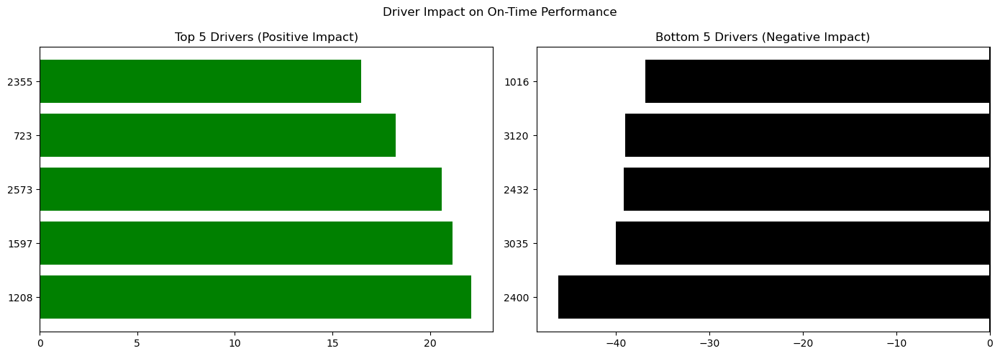

In [86]:
import matplotlib.pyplot as plt

base = driver_perf.copy()

# sort properly
top5 = base.sort_values('impact_pct', ascending=False).head(5)
bottom5 = base.sort_values('impact_pct', ascending=True).head(5)

# safety check (prevents silent blank plots)
print("Top 5:")
print(top5[['operator', 'impact_pct']])

print("\nBottom 5:")
print(bottom5[['operator', 'impact_pct']])

# -------------------------
# Plot
# -------------------------
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Top 5
axes[0].barh(top5['operator'].astype(str), top5['impact_pct'], color='green')
axes[0].set_title("Top 5 Drivers (Positive Impact)")
axes[0].axvline(0, color='black')

# Bottom 5
axes[1].barh(bottom5['operator'].astype(str), bottom5['impact_pct'], color='black')
axes[1].set_title("Bottom 5 Drivers (Negative Impact)")
axes[1].axvline(0, color='black')

plt.suptitle("Driver Impact on On-Time Performance")
plt.tight_layout()
plt.show()

In [87]:
driver_perf['impact_pct'].describe()

count    287.000000
mean      -2.201034
std       12.060862
min      -46.241120
25%       -8.820723
50%        0.861838
75%        6.448365
max       22.122598
Name: impact_pct, dtype: float64